# Task #5 -To explore Business Analytics

### importing some important Libraries

In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
pd.set_option("display.max_columns" , None)
pd.set_option("display.max_rows" , None)

### Loading Our Dataset.

In [3]:
df = pd.read_csv(r"superstore.csv")
df

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164
5,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Furniture,Furnishings,48.8600,7,0.00,14.1694
6,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Office Supplies,Art,7.2800,4,0.00,1.9656
7,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Technology,Phones,907.1520,6,0.20,90.7152
8,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Office Supplies,Binders,18.5040,3,0.20,5.7825
9,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Office Supplies,Appliances,114.9000,5,0.00,34.4700


### First 5 samples from our Dataset.

In [4]:
df.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


In [5]:
df.describe()

,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,55190.379428,229.858001,3.789574,0.156203,28.656896
std,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,90008.000000,209.940000,5.000000,0.200000,29.364000
max,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9994 non-null   object 
 1   Segment       9994 non-null   object 
 2   Country       9994 non-null   object 
 3   City          9994 non-null   object 
 4   State         9994 non-null   object 
 5   Postal Code   9994 non-null   int64  
 6   Region        9994 non-null   object 
 7   Category      9994 non-null   object 
 8   Sub-Category  9994 non-null   object 
 9   Sales         9994 non-null   float64
 10  Quantity      9994 non-null   int64  
 11  Discount      9994 non-null   float64
 12  Profit        9994 non-null   float64
dtypes: float64(3), int64(2), object(8)
memory usage: 1015.1+ KB


In [7]:
df.shape

(9994, 13)

In [11]:
df.columns

Index(['Ship Mode', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Category', 'Sub-Category', 'Sales', 'Quantity', 'Discount',
       'Profit'],
      dtype='object')

### Cleaning the Data

### Removing the country column

In [12]:
df = df.drop(["Country"] , axis = 1)

### Checking null counts

In [13]:
pd.DataFrame(df.isnull().sum(),columns=['Number of missing values'])

,Number of missing values
Ship Mode,0
Segment,0
City,0
State,0
Postal Code,0
Region,0
Category,0
Sub-Category,0
Sales,0
Quantity,0


> No missing values observed in our data.

In [14]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [15]:
df.duplicated().sum()

17

In [16]:
df.nunique()

Ship Mode          4
Segment            3
City             531
State             49
Postal Code      631
Region             4
Category           3
Sub-Category      17
Sales           5825
Quantity          14
Discount          12
Profit          7287
dtype: int64

In [17]:
df['Segment'].unique()

array(['Consumer', 'Corporate', 'Home Office'], dtype=object)

In [18]:
df['Ship Mode'].unique()

array(['Second Class', 'Standard Class', 'First Class', 'Same Day'],
      dtype=object)

In [19]:
df['Region'].unique()

array(['South', 'West', 'Central', 'East'], dtype=object)

In [20]:
df['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

In [21]:
data = df.drop_duplicates(keep='first')

In [22]:
dt = df.sort_values(by='Sales',ascending=False)

In [23]:
dt

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
2697,Standard Class,Home Office,Jacksonville,Florida,32216,South,Technology,Machines,22638.4800,6,0.50,-1811.0784
6826,Standard Class,Corporate,Lafayette,Indiana,47905,Central,Technology,Copiers,17499.9500,5,0.00,8399.9760
8153,First Class,Consumer,Seattle,Washington,98115,West,Technology,Copiers,13999.9600,4,0.00,6719.9808
2623,First Class,Home Office,New York City,New York,10024,East,Technology,Copiers,11199.9680,4,0.20,3919.9888
4190,Standard Class,Consumer,Newark,Delaware,19711,East,Technology,Copiers,10499.9700,3,0.00,5039.9856
9039,Standard Class,Consumer,Detroit,Michigan,48205,Central,Office Supplies,Binders,9892.7400,13,0.00,4946.3700
4098,Standard Class,Consumer,Minneapolis,Minnesota,55407,Central,Office Supplies,Binders,9449.9500,5,0.00,4630.4755
4277,Standard Class,Corporate,Lakewood,New Jersey,8701,East,Technology,Machines,9099.9300,7,0.00,2365.9818
8488,Second Class,Consumer,Arlington,Virginia,22204,South,Technology,Machines,8749.9500,5,0.00,2799.9840
6425,Standard Class,Consumer,Philadelphia,Pennsylvania,19120,East,Technology,Copiers,8399.9760,4,0.40,1119.9968


In [24]:
dt.shape

(9994, 12)

In [21]:
#pip install plotly

In [25]:
#pip install plotly
import plotly
import plotly.express as px
import plotly.offline as pyo
import matplotlib.pyplot as plt
%matplotlib inline

In [23]:
#pip install cufflinks

In [26]:
#pip install cufflinks
import cufflinks as cf##To bind plotly and pandas together.

In [27]:
from plotly.offline import init_notebook_mode,plot,iplot
pyo.init_notebook_mode(connected=True)#plotly connected to jupyter in ofline mode
cf.go_offline()


### Using Barchart

In [28]:
px.bar(dt,x='Region',y='Sales')

### Calculating Z-Score Value

In [29]:
dt['z-score'] = (dt.Sales-dt.Sales.mean())/dt.Sales.std()

In [30]:
dt.head()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score
2697,Standard Class,Home Office,Jacksonville,Florida,32216,South,Technology,Machines,22638.480,6,0.5,-1811.0784,35.954750
6826,Standard Class,Corporate,Lafayette,Indiana,47905,Central,Technology,Copiers,17499.950,5,0.0,8399.9760,27.709952
8153,First Class,Consumer,Seattle,Washington,98115,West,Technology,Copiers,13999.960,4,0.0,6719.9808,22.094200
2623,First Class,Home Office,New York City,New York,10024,East,Technology,Copiers,11199.968,4,0.2,3919.9888,17.601598
4190,Standard Class,Consumer,Newark,Delaware,19711,East,Technology,Copiers,10499.970,3,0.0,5039.9856,16.478448


In [31]:
dt[dt['z-score']>3]

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score
2697,Standard Class,Home Office,Jacksonville,Florida,32216,South,Technology,Machines,22638.4800,6,0.50,-1811.0784,35.954750
6826,Standard Class,Corporate,Lafayette,Indiana,47905,Central,Technology,Copiers,17499.9500,5,0.00,8399.9760,27.709952
8153,First Class,Consumer,Seattle,Washington,98115,West,Technology,Copiers,13999.9600,4,0.00,6719.9808,22.094200
2623,First Class,Home Office,New York City,New York,10024,East,Technology,Copiers,11199.9680,4,0.20,3919.9888,17.601598
4190,Standard Class,Consumer,Newark,Delaware,19711,East,Technology,Copiers,10499.9700,3,0.00,5039.9856,16.478448
9039,Standard Class,Consumer,Detroit,Michigan,48205,Central,Office Supplies,Binders,9892.7400,13,0.00,4946.3700,15.504144
4098,Standard Class,Consumer,Minneapolis,Minnesota,55407,Central,Office Supplies,Binders,9449.9500,5,0.00,4630.4755,14.793685
4277,Standard Class,Corporate,Lakewood,New Jersey,8701,East,Technology,Machines,9099.9300,7,0.00,2365.9818,14.232077
8488,Second Class,Consumer,Arlington,Virginia,22204,South,Technology,Machines,8749.9500,5,0.00,2799.9840,13.670532
6425,Standard Class,Consumer,Philadelphia,Pennsylvania,19120,East,Technology,Copiers,8399.9760,4,0.40,1119.9968,13.108997


In [32]:
dt.shape

(9994, 13)

In [33]:
dt[dt['z-score']<-3]

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score


### Removing Outliers From Our Dataset.

In [34]:
dt_no_outliers = dt[dt['z-score']<3]

In [35]:
dt_no_outliers.head()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score
6467,Standard Class,Home Office,Providence,Rhode Island,2908,East,Office Supplies,Storage,2079.400,5,0.0,582.2320,2.967600
949,Standard Class,Home Office,Philadelphia,Pennsylvania,19120,East,Furniture,Tables,2065.320,12,0.4,-619.5960,2.945008
3628,Standard Class,Consumer,Seattle,Washington,98103,West,Office Supplies,Binders,2060.744,7,0.2,643.9825,2.937666
3043,Same Day,Home Office,Long Beach,California,90805,West,Furniture,Chairs,2054.272,8,0.2,256.7840,2.927282
8168,Standard Class,Home Office,Seattle,Washington,98105,West,Furniture,Tables,2036.860,7,0.0,366.6348,2.899344


In [36]:
new_dt = dt_no_outliers

In [37]:
new_dt.shape

(9867, 13)

>HERE ARE OUTLIERS OBSERVED IN OUR DATA. NOW OUR DATA IS CLEAN.

### Scatter Plot BEFORE Removing Outliers.

In [38]:
px.scatter(dt,x='Region',y='Sales',size='Sales')

In [37]:
px.scatter_matrix(new_dt,color='Region',title='Market',dimensions=['Sales', 'Quantity', 'Discount', 'Profit'])

### Distribution Plots

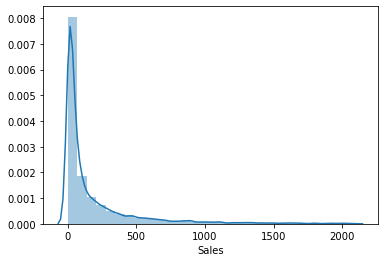

In [39]:

sns.distplot(new_dt['Sales'],bins=30)


In [39]:
#pip install Filter

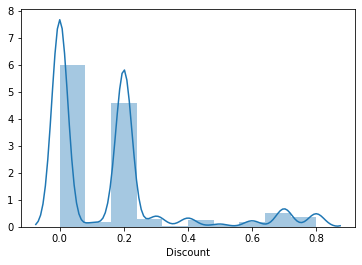

In [40]:
sns.distplot(new_dt['Discount'],bins=10)

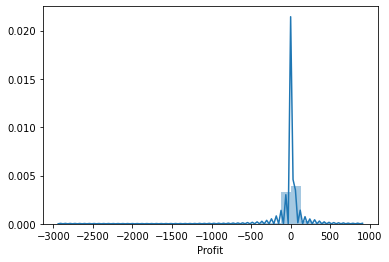

In [41]:
sns.distplot(new_dt['Profit'],bins=30)

>## Normal Distribution Observed in our Data.

In [41]:
new_dt = new_dt.drop(['z-score','Postal Code'],axis=1)

### Correleation Matrix

In [42]:
new_dt.corr()

,Sales,Quantity,Discount,Profit
Sales,1.000000,0.255552,-0.041876,0.271660
Quantity,0.255552,1.000000,0.010904,0.076426
Discount,-0.041876,0.010904,1.000000,-0.355820
Profit,0.271660,0.076426,-0.355820,1.000000


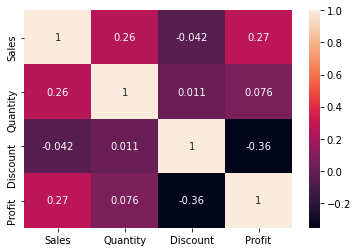

In [43]:
sns.heatmap(new_dt.corr(),annot=True)

>AS WE CAN SEE CORRELATION BETWEEN SALES AND PROFIT ,QUANTITY AND SALES ARE MAJORE.

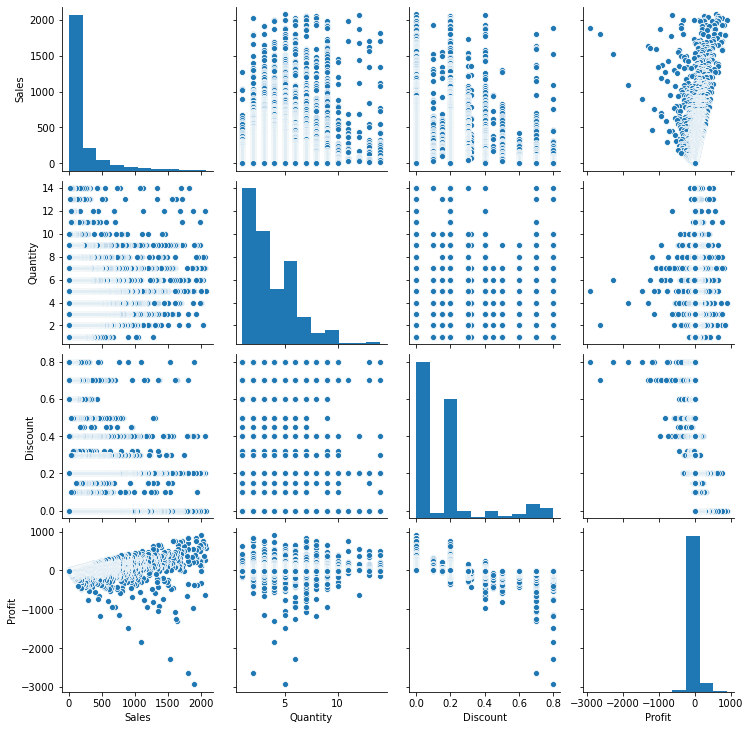

In [44]:
sns.pairplot(new_dt)

### visualizing the data.

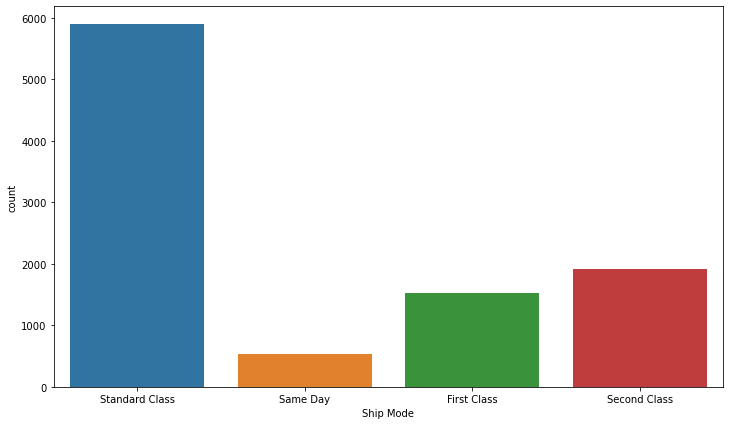

In [45]:
plt.figure(figsize=(12,7))
sns.countplot(x=new_dt["Ship Mode"])
plt.show()

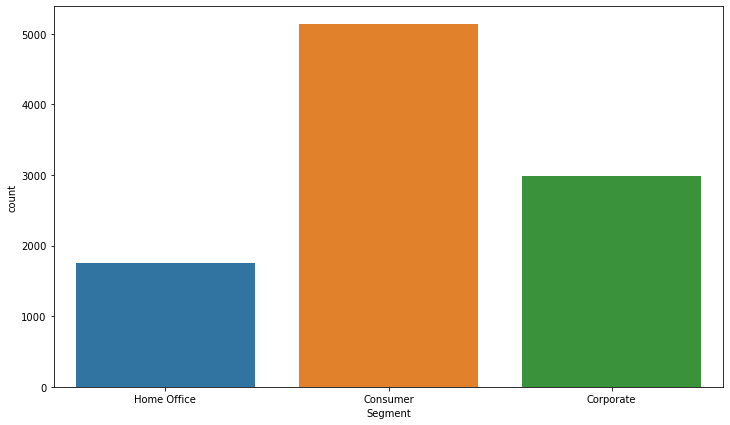

In [46]:
plt.figure(figsize=(12,7))
sns.countplot(x=new_dt["Segment"])
plt.show()

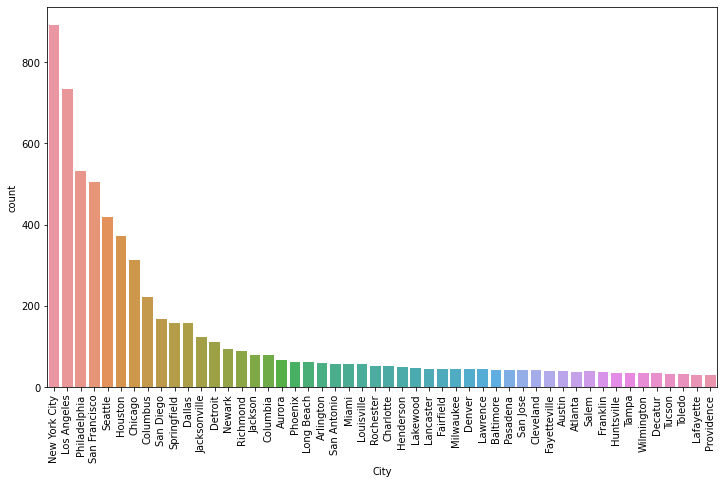

In [47]:
plt.figure(figsize=(12,7))
sns.countplot(x=new_dt["City"],order=(data['City'].value_counts().head(50)).index)
plt.xticks(rotation = 90)
plt.show()

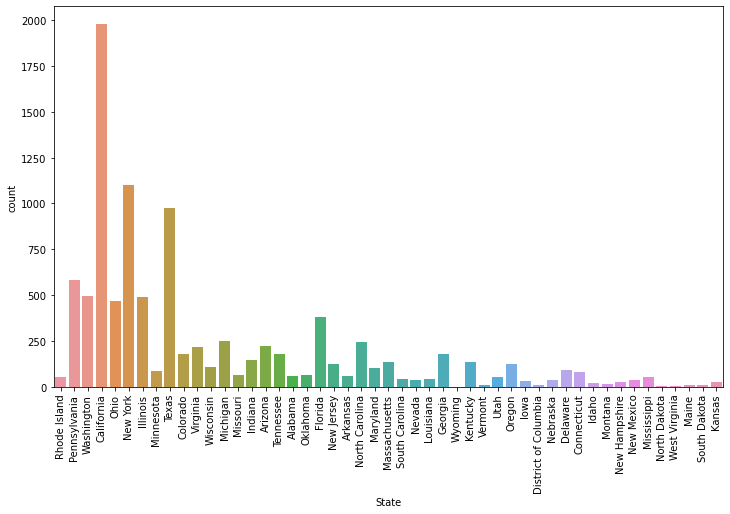

In [48]:
plt.figure(figsize=(12,7))
sns.countplot(x=new_dt["State"])
plt.xticks(rotation = 90)
plt.show()

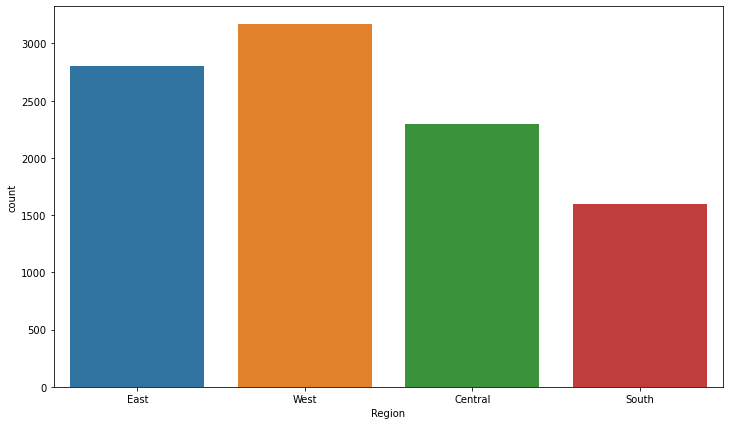

In [49]:
plt.figure(figsize=(12,7))
sns.countplot(x=new_dt["Region"])
plt.show()

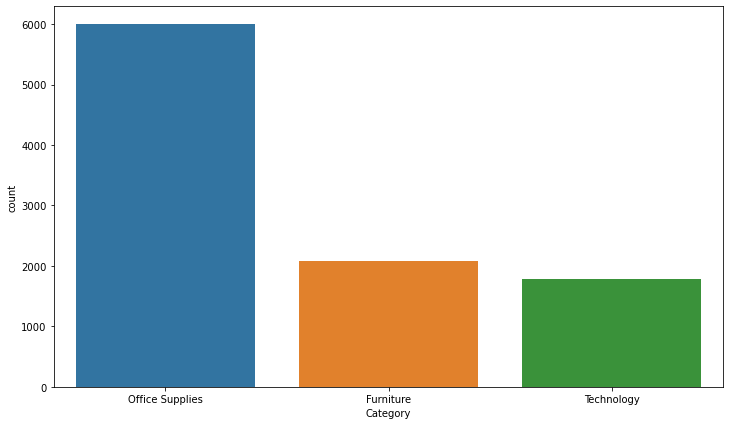

In [50]:
plt.figure(figsize=(12,7))
sns.countplot(x=new_dt["Category"])
plt.show()

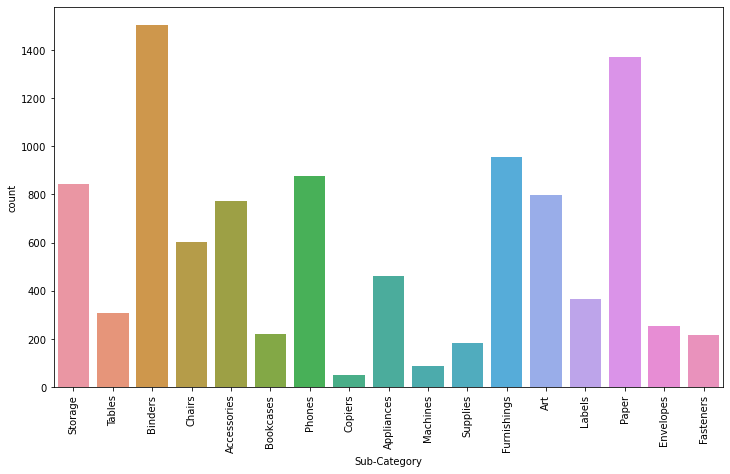

In [51]:
plt.figure(figsize=(12,7))
sns.countplot(x=new_dt["Sub-Category"])
plt.xticks(rotation = 90)
plt.show()

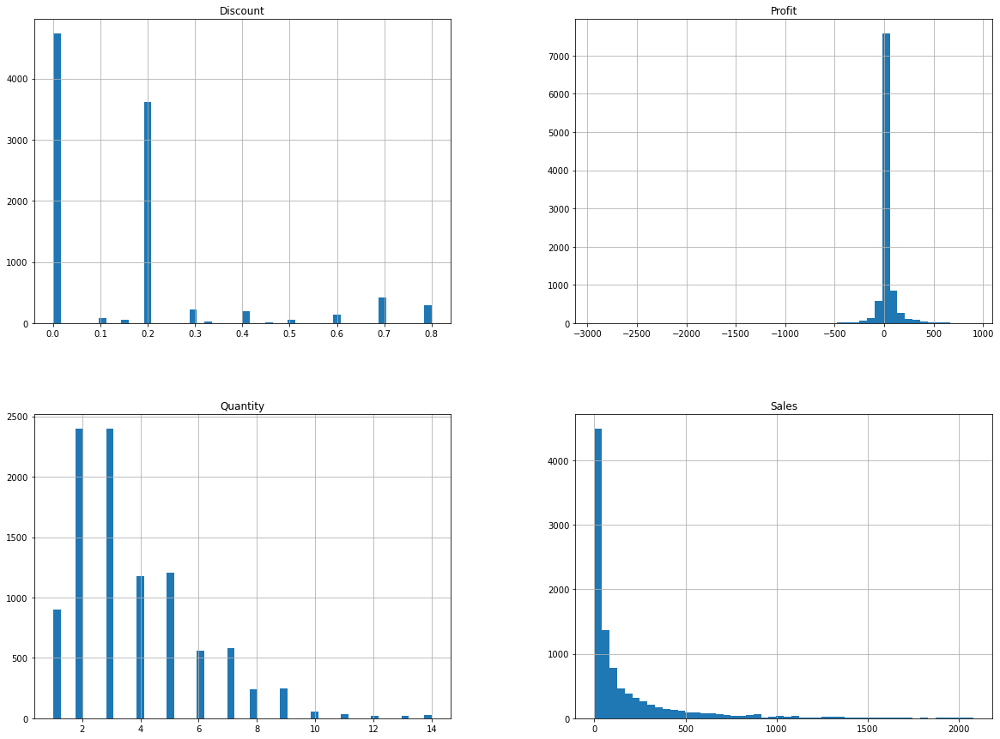

In [53]:
new_dt.hist(bins=50,figsize=(20,15))
plt.show()

### Pie-Chart

In [54]:
Gp1 = new_dt.groupby(['Category']).Discount.sum().sort_values(ascending = False).reset_index()
Gp2 =new_dt.groupby(['Category']).Profit.sum().sort_values(ascending = False).reset_index()
merge1= pd.merge(Gp1, Gp2, how='right',on='Category')
merge1.rename(columns={'Discount':'Overall_Discount','Profit':'Overall_Profit'},inplace = True)
merge1

,Category,Overall_Discount,Overall_Profit
0,Office Supplies,944.80,90263.5534
1,Furniture,364.42,14210.0055
2,Technology,235.40,86961.0770


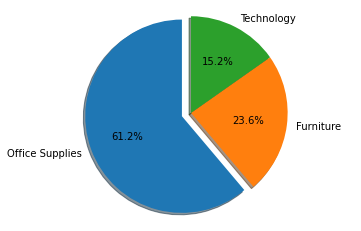

In [55]:
Category = 'Office Supplies','Furniture', 'Technology'
fig1, ax1 = plt.subplots()
explode=(0.1,0,0)#It"explode" the 1st slice
ax1.pie(merge1["Overall_Discount"],explode=explode, labels=Category, autopct='%1.1f%%',shadow=True,startangle=90)##explode must be a length of X
ax1.axis('equal')#Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

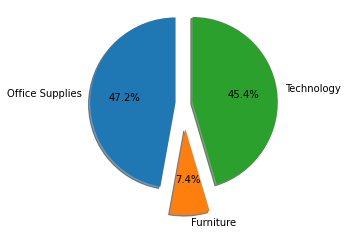

In [56]:
fig1, ax1 = plt.subplots()
explode=(0.1,0.3,0.1)#It"explode" the 1st slice
ax1.pie(merge1["Overall_Profit"],explode=explode, labels=Category, autopct='%1.1f%%',shadow=True,startangle=90)##explode must be a length of X
ax1.axis('equal')#Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

> From the above two charts we can observed profit percentage and Discount percentage for each category.Here we can visualize that "Office Supplies" has suffered the highest amount of profit and Discount as well but on the other hand "Technology" category has lowest discount among all categories but gaining good amount of profit. we are facing loss in "Furniture" category.

###  COMPARING DISCOUNT AND PROFIT DIAGRAMS ON THE BASIS OF 'REGION'

In [57]:
Gp3 = new_dt.groupby(['Region']).Discount.sum().sort_values(ascending = False).reset_index()
Gp4 =new_dt.groupby(['Region']).Profit.sum().sort_values(ascending = False).reset_index()
merge2= pd.merge(Gp3, Gp4, how='right',on='Region')
merge2.rename(columns={'Discount':'Overall_Discount','Profit':'Overall_Profit'},inplace = True)
merge2

,Region,Overall_Discount,Overall_Profit
0,Central,554.82,15819.1309
1,East,409.80,53824.9307
2,West,344.35,83951.7150
3,South,235.65,37838.8593


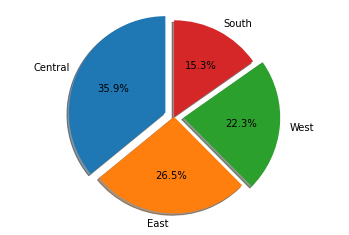

In [58]:
Region =  'Central', 'East','West','South'
fig1, ax1 = plt.subplots()
explode=(0.1,0,0.1,0)#It"explode" the 1st slice
ax1.pie(merge2["Overall_Discount"],explode=explode, labels=Region, autopct='%1.1f%%',shadow=True,startangle=90)##explode must be a length of X
ax1.axis('equal')#Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

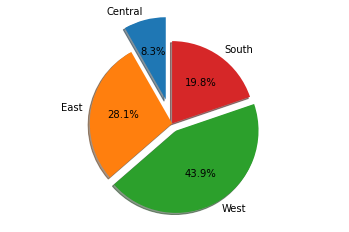

In [59]:
Region =  'Central', 'East','West','South'
fig1, ax1 = plt.subplots()
explode=(0.3,0,0.1,0)#It"explode" the 1st slice
ax1.pie(merge2["Overall_Profit"],explode=explode, labels=Region, autopct='%1.1f%%',shadow=True,startangle=90)##explode must be a length of X
ax1.axis('equal')#Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

> From the above two charts we can obseved a huge amount of loss in "central" Region beacause Company(store) is offering high Discount on Products in the Central Region but Outcome is very less.Now take a look at the percentage of "West" Region og Discount & Profit almost here Profit is double the Discount

### COMPARING QUANTITY AND SALES DIAGRAMS ON THE BASIS OF 'CATEGORY'

In [60]:
Gp5 = new_dt.groupby(['Category']).Quantity.sum().sort_values(ascending = False).reset_index()
Gp6 =new_dt.groupby(['Category']).Sales.sum().sort_values(ascending = False).reset_index()
merge3= pd.merge(Gp5, Gp6, how='right',on='Category')
merge3.rename(columns={'Quantity':'Total_Quantity','Sales':'Total_Sales'},inplace = True)
merge3

,Category,Total_Quantity,Total_Sales
0,Office Supplies,22735,594358.8600
1,Furniture,7775,644044.8807
2,Technology,6571,543164.3200


In [61]:
new_dt['Category'].unique()

array(['Office Supplies', 'Furniture', 'Technology'], dtype=object)

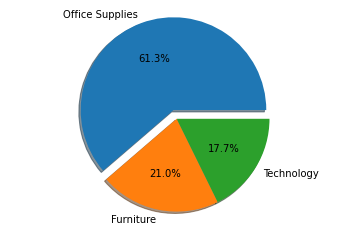

In [62]:
Category = 'Office Supplies', 'Furniture', 'Technology'
fig1, ax1 = plt.subplots()
explode=(0.1,0,0)#It"explode" the 1st slice
ax1.pie(merge3["Total_Quantity"],explode=explode, labels=Category, autopct='%1.1f%%',shadow=True)##explode must be a length of X
ax1.axis('equal')#Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

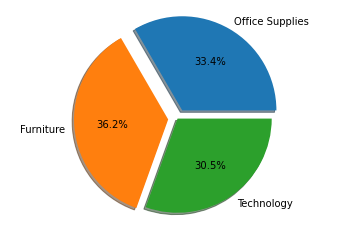

In [63]:
fig1, ax1 = plt.subplots()
explode=(0.1,0.1,0)#It"explode" the 1st slice
ax1.pie(merge3["Total_Sales"],explode=explode, labels=Category, autopct='%1.1f%%',shadow=True)##explode must be a length of X
ax1.axis('equal')#Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

> Above Charts representing "Office Supplies" has the highest amount of quantity and Sales also but on the other hand "Technology" category & "Furniture" category consist of lesser amount of total quantity but Total Sales Percentage are good enough.


### Top 10 Profitable Cities.x

In [64]:
dt_top_10_cities = new_dt.groupby("City")["Profit"].sum().reset_index().sort_values(by="Profit",ascending=False)
dt_top_10_cities.head(10)

,City,Profit
329,New York City,34897.5783
266,Los Angeles,24592.5499
452,Seattle,17581.2251
438,San Francisco,15678.3905
123,Detroit,6854.4448
94,Columbus,5132.7195
437,San Diego,4969.8885
407,Richmond,4872.7471
215,Jackson,4688.6484
93,Columbia,4335.1267


In [65]:
dt_top_10_cities = new_dt.groupby("City")["Discount"].sum().reset_index().sort_values(by="Discount",ascending=False)
dt_top_10_cities.head(10)

,City,Discount
374,Philadelphia,174.10
207,Houston,141.82
80,Chicago,120.10
109,Dallas,56.30
266,Los Angeles,53.15
329,New York City,49.70
94,Columbus,38.50
216,Jacksonville,35.15
438,San Francisco,33.60
452,Seattle,27.00


### Top 10 Profitable Sub-Categories.

In [66]:
dt_top_10_sub_categories = new_dt.groupby("Sub-Category")["Profit"].sum().reset_index().sort_values(by="Profit",ascending=False)
dt_top_10_sub_categories.head(10)

,Sub-Category,Profit
0,Accessories,39503.4923
13,Phones,37886.6451
12,Paper,34053.5693
5,Chairs,21989.2644
14,Storage,19864.5829
1,Appliances,14633.8139
6,Copiers,13974.6680
9,Furnishings,13059.1436
7,Envelopes,6964.1767
2,Art,6527.7870


In [67]:
dt_top_10_sub_categories = new_dt.groupby("Sub-Category")["Discount"].sum().reset_index().sort_values(by="Discount",ascending=False)
dt_top_10_sub_categories.head(10)

,Sub-Category,Discount
3,Binders,564.40
13,Phones,136.20
9,Furnishings,132.40
5,Chairs,103.10
12,Paper,102.60
16,Tables,82.15
1,Appliances,77.60
14,Storage,63.20
0,Accessories,60.80
2,Art,59.60


### Top 2 sales Region

In [67]:
dt_top_10_region = new_dt.groupby("Region")["Sales"].sum().reset_index().sort_values(by="Sales",ascending=False)
dt_top_10_region.head(2)

,Region,Sales
3,West,592610.3555
1,East,506698.1940


>CONCLUSION.
- Correlation Matrix showing positive relationship between Profit & Sales, Quantity & Sales.
- Company offering more Discount on Office Sppliers & furniture Category.
- In the Central Rregion company(Store) giving lots of discount but the Output is very less in quantity. - Company Provides highest Quantity for Office Suppliers but Sales are not that much good enough,Quantity should be minimized and provide it to the Furniture category instead of Office Suppliers.



#### Task-5

## Thank You !